In [131]:
! pip install category_encoders

In [132]:
!pip install xgboost


In [296]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
pd.options.mode.chained_assignment = None 
#ENCODING
import category_encoders as ce
from sklearn.preprocessing import LabelEncoder
#SCALING
from sklearn.preprocessing import StandardScaler
#Feature Selection:
from sklearn.feature_selection import VarianceThreshold
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
#ML
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
import xgboost as xg
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
import numpy as np 
import pandas as pd 

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [297]:
cars = pd.read_csv(r"C:\Users\asli_\PYTHON_PROJECTS\data science projects\car_prediction\car_price_prediction.csv")

In [298]:
cars.head()

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4


In [299]:
cars.shape


(19237, 18)

In [300]:
cars.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19237 entries, 0 to 19236
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                19237 non-null  int64  
 1   Price             19237 non-null  int64  
 2   Levy              19237 non-null  object 
 3   Manufacturer      19237 non-null  object 
 4   Model             19237 non-null  object 
 5   Prod. year        19237 non-null  int64  
 6   Category          19237 non-null  object 
 7   Leather interior  19237 non-null  object 
 8   Fuel type         19237 non-null  object 
 9   Engine volume     19237 non-null  object 
 10  Mileage           19237 non-null  object 
 11  Cylinders         19237 non-null  float64
 12  Gear box type     19237 non-null  object 
 13  Drive wheels      19237 non-null  object 
 14  Doors             19237 non-null  object 
 15  Wheel             19237 non-null  object 
 16  Color             19237 non-null  object

In [301]:
cars.isnull().sum(axis=0)

ID                  0
Price               0
Levy                0
Manufacturer        0
Model               0
Prod. year          0
Category            0
Leather interior    0
Fuel type           0
Engine volume       0
Mileage             0
Cylinders           0
Gear box type       0
Drive wheels        0
Doors               0
Wheel               0
Color               0
Airbags             0
dtype: int64

In [302]:
ncars=cars.drop_duplicates(keep=False)

In [303]:
ncars.shape

(18704, 18)

In [304]:
ncars.head()

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4
5,45802912,39493,891,HYUNDAI,Santa FE,2016,Jeep,Yes,Diesel,2,160931 km,4.0,Automatic,Front,04-May,Left wheel,White,4


In [305]:
ncars.Levy.dtype


dtype('O')

In [306]:
ncars['Levy'] = ncars['Levy'].astype(str).str.replace('-', '0')  # 'Levy' sütununu stringe çevir ve '-' karakterini '0' ile değiştir

In [307]:
ncars.Levy = ncars.Levy.astype('int64')  # 'Levy' sütununu 64-bit tamsayıya dönüştür

In [308]:
ncars.Levy  # 'Levy' sütununa erişim

0        1399
2           0
3         862
4         446
5         891
         ... 
19232       0
19233     831
19234     836
19235    1288
19236     753
Name: Levy, Length: 18704, dtype: int64

In [309]:
ncars.Mileage.head()  # 'Mileage' sütunundaki ilk 5 satırı göster

0    186005 km
2    200000 km
3    168966 km
4     91901 km
5    160931 km
Name: Mileage, dtype: object

In [310]:
# 'Mileage' sütunundan 'km' ifadesini kaldırıyoruz
ncars.Mileage = ncars.Mileage.apply(lambda x: str(x).replace("km", " "))

# 'Mileage' sütununu tamsayıya (int) çeviriyoruz
ncars.Mileage = ncars.Mileage.apply(lambda x: int(x))

In [311]:
ncars.Mileage

0        186005
2        200000
3        168966
4         91901
5        160931
          ...  
19232    300000
19233    161600
19234    116365
19235     51258
19236    186923
Name: Mileage, Length: 18704, dtype: int64

In [312]:
ncars.Doors.head()

0    04-May
2    04-May
3    04-May
4    04-May
5    04-May
Name: Doors, dtype: object

In [313]:
ncars.Doors.unique()

array(['04-May', '02-Mar', '>5'], dtype=object)

In [314]:
# 'Doors' sütunundaki '04-May' ifadesini '4-5' ve '02-Mar' ifadesini '2-3' ile değiştiriyoruz
ncars.Doors = ncars.Doors.str.replace('04-May', '4-5').replace('02-Mar', '2-3')

In [315]:
ncars.Doors.unique()

array(['4-5', '2-3', '>5'], dtype=object)

In [316]:
ncars['Engine volume']

0              3.5
2              1.3
3              2.5
4              1.3
5                2
           ...    
19232    2.0 Turbo
19233          2.4
19234            2
19235            2
19236          2.4
Name: Engine volume, Length: 18704, dtype: object

In [317]:
# Geçersiz veya eksik değerleri işlemek için 'Engine volume' sütununu sayısal formata çeviriyoruz, geçersizleri 'NaN' yapıyoruz
ncars['Engine volume'] = pd.to_numeric(ncars['Engine volume'], errors='coerce')

In [318]:
ncars['Engine volume']

0        3.5
2        1.3
3        2.5
4        1.3
5        2.0
        ... 
19232    NaN
19233    2.4
19234    2.0
19235    2.0
19236    2.4
Name: Engine volume, Length: 18704, dtype: float64

In [319]:
# 'Airbags' sütununu nesne (object) veri tipine çeviriyoruz, genellikle metin verisi için kullanılır
ncars.Airbags = ncars.Airbags.astype('O')

In [320]:
ncars['Cylinders'] = ncars['Cylinders'].astype('O')

In [321]:
ncars['Prod. year'] = ncars['Prod. year'].astype('O')


In [322]:
ncars.describe()

,ID,Price,Levy,Engine volume,Mileage
count,1.870400e+04,1.870400e+04,18704.000000,16832.000000,1.870400e+04
mean,4.557522e+07,1.860236e+04,632.444985,2.310908,1.572059e+06
std,9.363561e+05,1.932520e+05,569.018150,0.887780,4.908815e+07
min,2.074688e+07,1.000000e+00,0.000000,0.000000,0.000000e+00
25%,4.569182e+07,5.331000e+03,0.000000,1.800000,7.030300e+04
50%,4.577164e+07,1.317200e+04,642.000000,2.000000,1.266900e+05
75%,4.580162e+07,2.200000e+04,915.000000,2.500000,1.895300e+05
max,4.581665e+07,2.630750e+07,11714.000000,20.000000,2.147484e+09


In [323]:
ncars.columns

Index(['ID', 'Price', 'Levy', 'Manufacturer', 'Model', 'Prod. year',
       'Category', 'Leather interior', 'Fuel type', 'Engine volume', 'Mileage',
       'Cylinders', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color',
       'Airbags'],
      dtype='object')

In [324]:
# Kategorik (nesne) veri tipine sahip sütunları seçiyoruz
cat_col = list(cars.select_dtypes('O').columns)

# Sayısal veri tipine sahip sütunları seçiyoruz
num_col = list(cars.select_dtypes(np.number).columns)

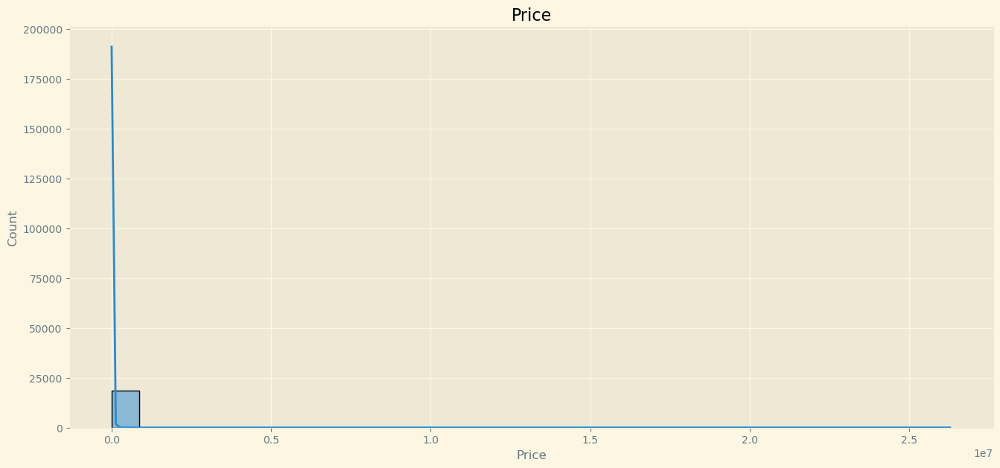

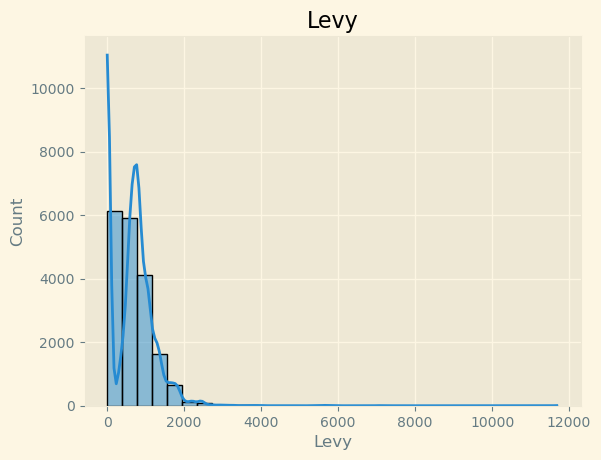

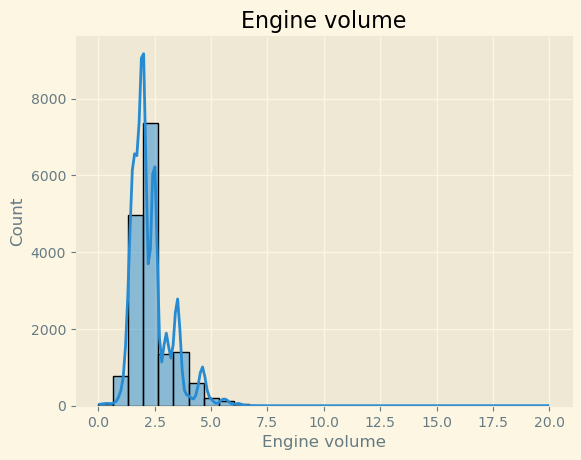

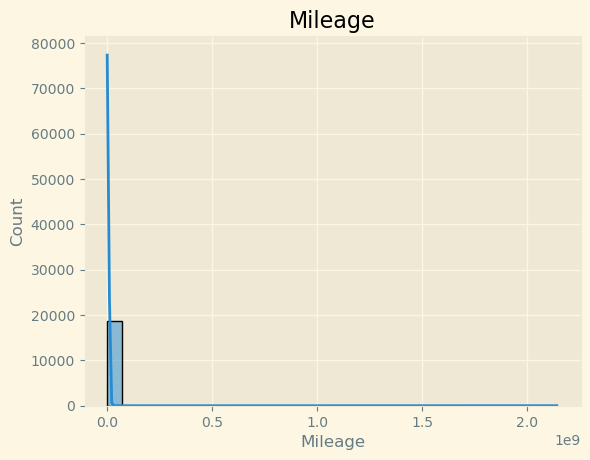

In [352]:
# Grafik stilini ayarlıyoruz
plt.style.use('Solarize_Light2')

# Grafiğin boyutunu ayarlıyoruz
plt.figure(figsize=[16, 7])

# Her sayısal sütun için ayrı histogram çizmeyi sağlamak için döngü başlatıyoruz
for j in num_col:
    # Her sütun için histogram çiziyoruz
    sns.histplot(ncars[j], bins=30, kde=True)  # kde=True, yoğunluk tahminini ekler
    
    # Başlık ekliyoruz
    plt.title(j)
    
    # Grafiği gösteriyoruz
    plt.show()

In [326]:
ccars=ncars.copy()

In [327]:
# Sayısal sütunları seçiyoruz
numeric_columns = ccars.select_dtypes(include='number')

# 1. çeyrek (Q1) değerlerini hesaplıyoruz
q1 = numeric_columns.quantile(0.25)

# 3. çeyrek (Q3) değerlerini hesaplıyoruz
q3 = numeric_columns.quantile(0.75)

# Çeyrekler arası aralığı (IQR) hesaplıyoruz
iqr = q3 - q1

# Aykırı değerleri filtrelemek için koşul belirliyoruz
# (Q1 - 3 * IQR) alt sınır ve (Q3 + 3 * IQR) üst sınır hesaplanıyor
# Aykırı değerleri içermeyen verileri seçiyoruz
ccars_cleaned = ccars[~((numeric_columns < (q1 - 3 * iqr)) | (numeric_columns > (q3 + 3 * iqr))).any(axis=1)]

# Temizlenmiş DataFrame'i görüntüleme
print("Temizlenmiş ccars DataFrame:")
print(ccars_cleaned.head())

Temizlenmiş ccars DataFrame:
         ID  Price  Levy Manufacturer     Model Prod. year   Category  \
0  45654403  13328  1399        LEXUS    RX 450       2010       Jeep   
2  45774419   8467     0        HONDA       FIT       2006  Hatchback   
3  45769185   3607   862         FORD    Escape       2011       Jeep   
4  45809263  11726   446        HONDA       FIT       2014  Hatchback   
5  45802912  39493   891      HYUNDAI  Santa FE       2016       Jeep   

  Leather interior Fuel type  Engine volume  Mileage Cylinders Gear box type  \
0              Yes    Hybrid            3.5   186005       6.0     Automatic   
2               No    Petrol            1.3   200000       4.0      Variator   
3              Yes    Hybrid            2.5   168966       4.0     Automatic   
4              Yes    Petrol            1.3    91901       4.0     Automatic   
5              Yes    Diesel            2.0   160931       4.0     Automatic   

  Drive wheels Doors             Wheel   Color Airb

In [328]:
len(ccars)

18704

In [329]:
len(ncars)

18704

In [330]:
# Kategorik (nesne) veri tipine sahip sütunları seçiyoruz
cat_col = list(ccars.select_dtypes('O').columns)

# Sayısal veri tipine sahip sütunları seçiyoruz
num_col = list(ccars.select_dtypes(np.number).columns)

In [332]:
num_col.remove('ID')
ccars.drop(columns='ID',inplace=True)

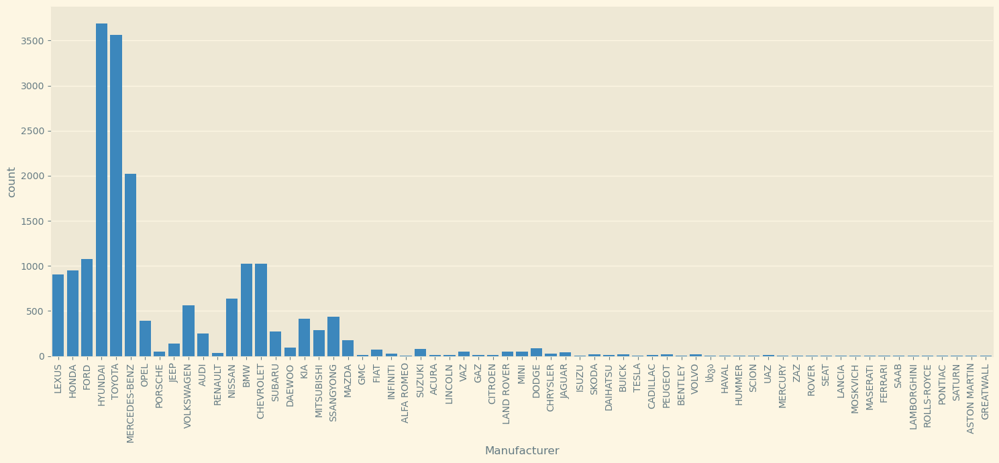

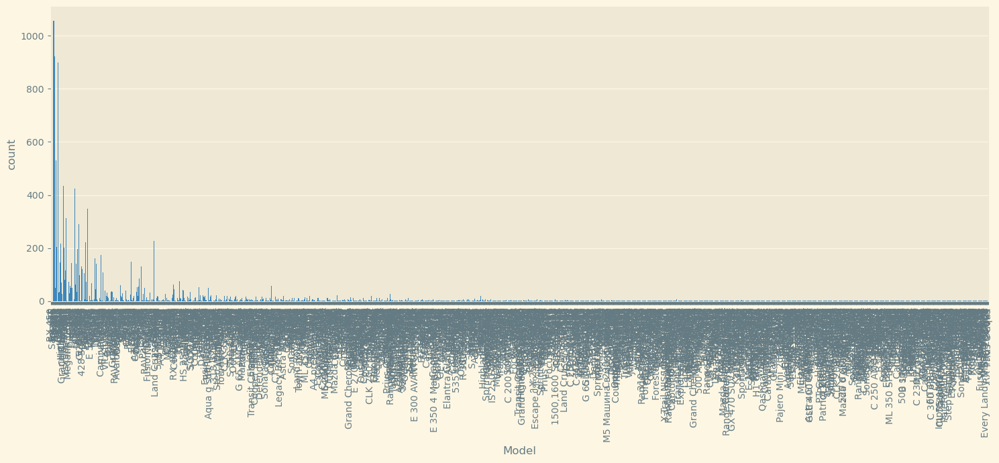

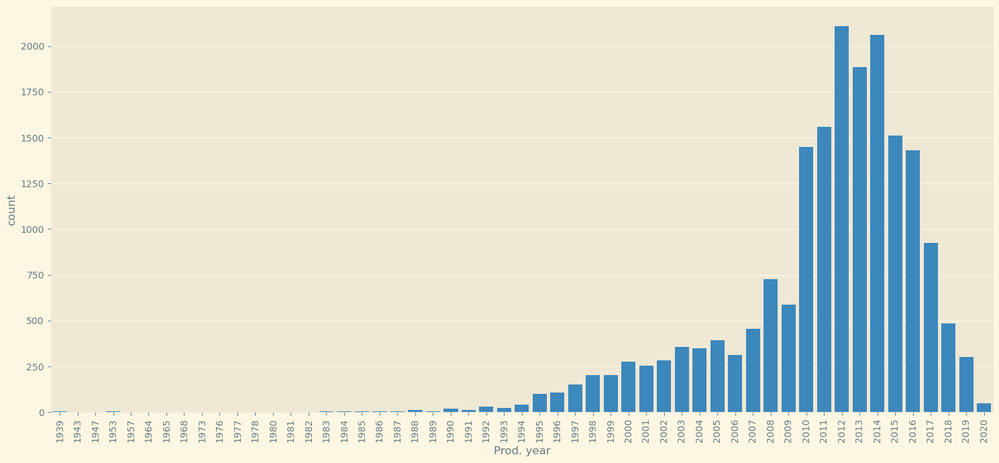

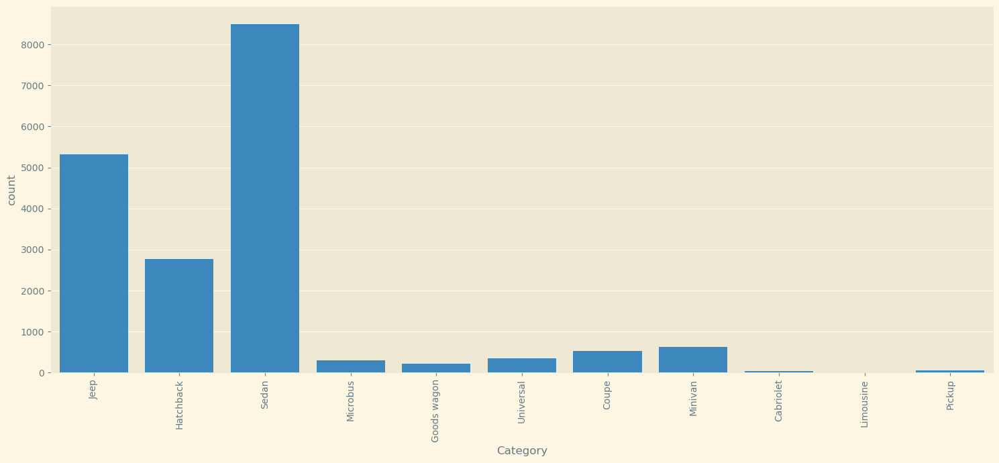

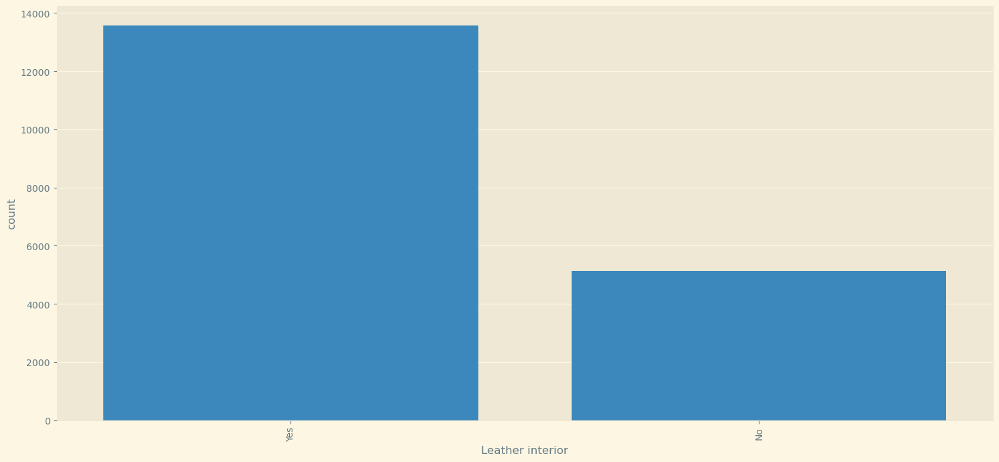

...

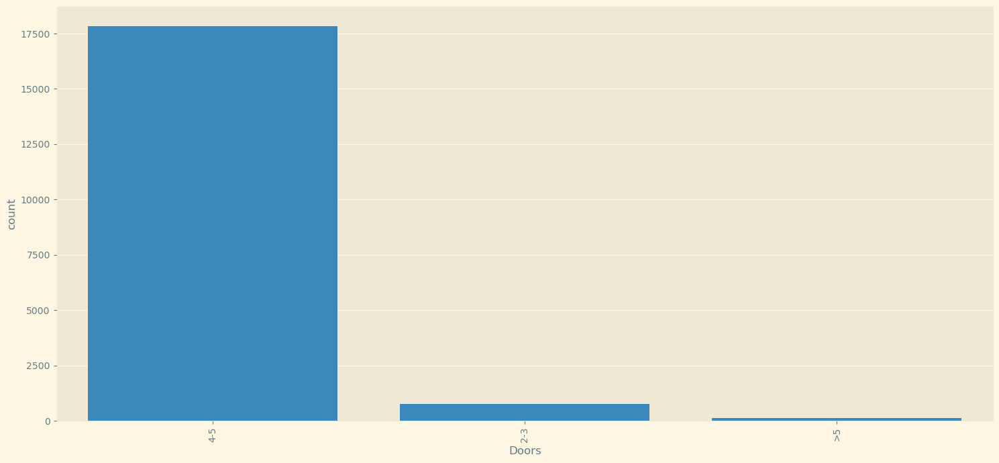

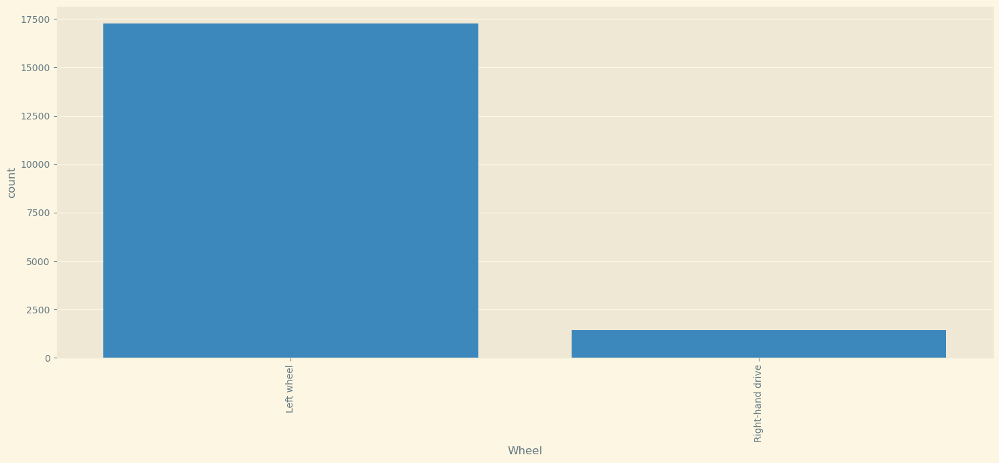

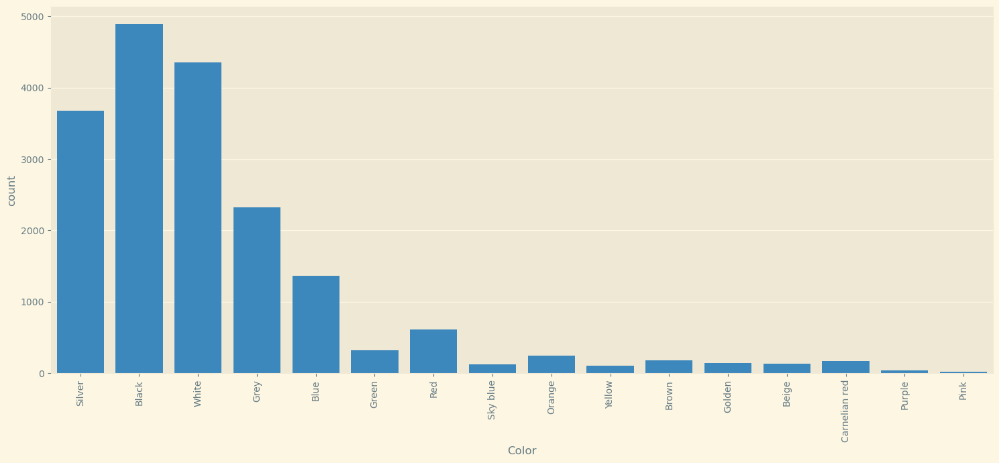

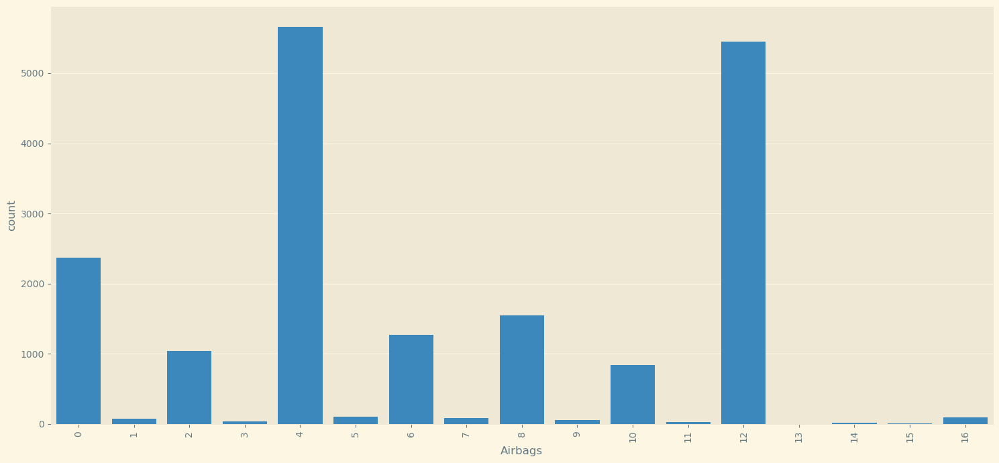

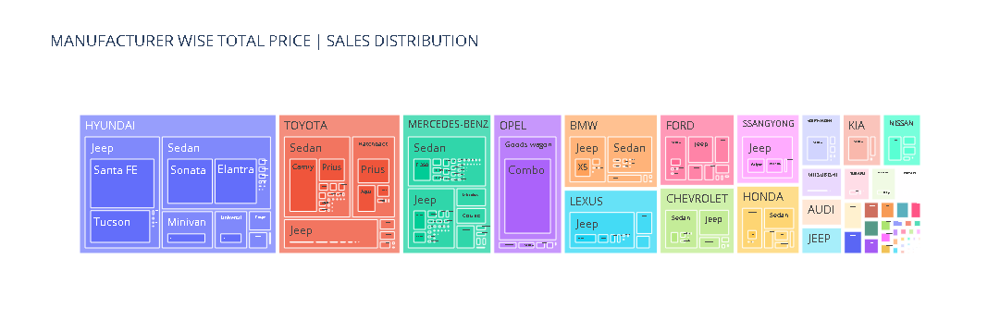

In [354]:
# Jupyter Notebook içinde grafiklerin görünmesi için gerekli ayar
%matplotlib inline

# Kategorik sütunlar için sayım grafiği oluşturma
for i in cat_col:
    # Her bir kategorik sütun için yeni bir grafik oluşturuyoruz
    plt.figure(figsize=[15, 7])
    
    # Sayım grafiği çiziyoruz
    sns.countplot(x=ccars[i])
    
    # X eksenindeki etiketleri 90 derece döndürüyoruz
    plt.xticks(rotation=90)
    
    # Grafiğin düzenini sıkılaştırıyoruz
    plt.tight_layout()
    
    # Grafiği gösteriyoruz
    plt.show()  # Her grafik ayrı ayrı gösterilecek

# Ağaç haritasını oluşturma
fig = px.treemap(data_frame=ccars, path=["Manufacturer", "Category", "Model"], values='Price', title='MANUFACTURER WISE TOTAL PRICE | SALES DISTRIBUTION')

# Ağaç haritasını gösteriyoruz
fig.show()  # Ağaç haritası ayrı bir satırda gösterilecek

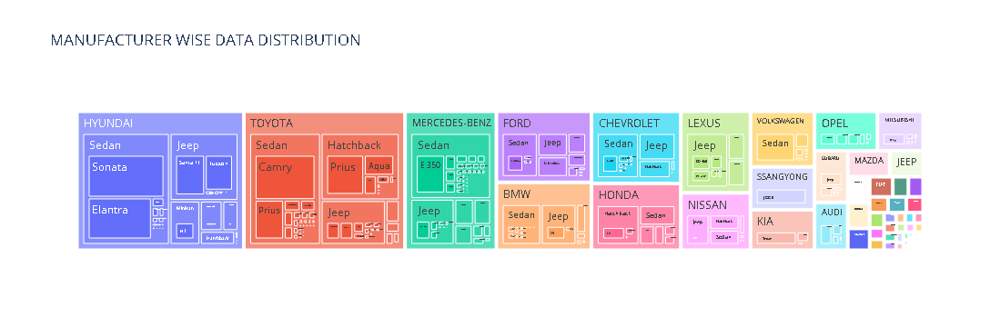

In [355]:
import plotly.express as px  # Plotly Express kütüphanesini içe aktarıyoruz

# Ağaç haritasını oluşturma
fig = px.treemap(
    data_frame=ccars,                     # Kullanılacak veri çerçevesi
    path=["Manufacturer", "Category", "Model"],  # Ağaç haritasındaki katmanları tanımlıyoruz
    title='MANUFACTURER WISE DATA DISTRIBUTION'  # Ağaç haritasının başlığını belirliyoruz
)

# Ağaç haritasını gösteriyoruz
fig.show()  # Ağaç haritasını ekranda gösterir


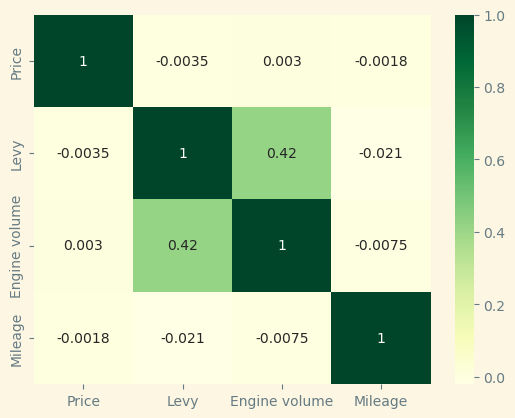

In [336]:
# Sayısal sütunları seçme
numeric_columns = ccars.select_dtypes(include='number')  # 'ccars' veri çerçevesindeki sayısal sütunları seçiyoruz

# Korelasyon matrisini hesaplama
correlation_matrix = numeric_columns.corr()  # Sayısal sütunlar arasındaki korelasyonu hesaplıyoruz

# Isı haritasını oluşturma
sns.heatmap(data=correlation_matrix, cmap='YlGn', annot=True)  # Korelasyon matrisini ısı haritası olarak çiziyoruz
# 'cmap' parametresi renk paletini belirler, 'annot=True' ise hücrelerdeki değerleri gösterir

# Görselleştirme
plt.show()  # Isı haritasını ekranda gösteriyoruz

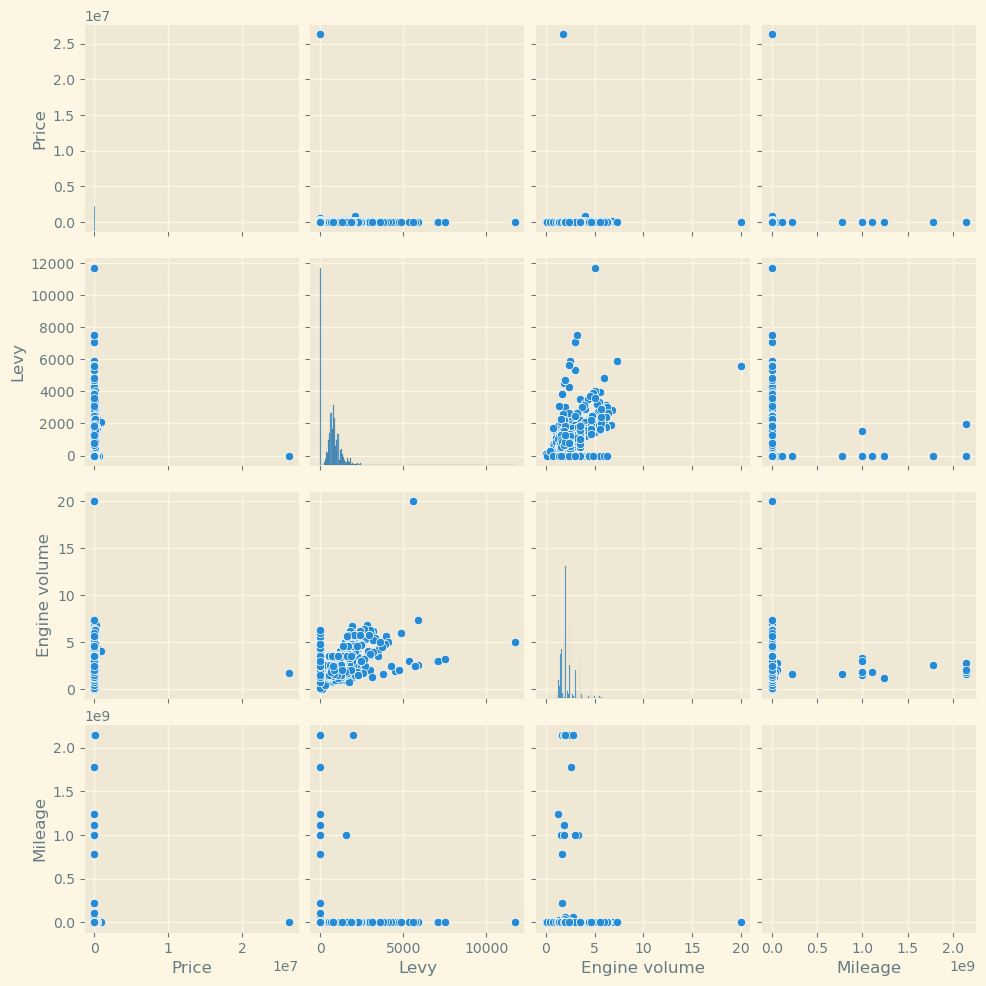

In [337]:
sns.pairplot(ccars[num_col])
plt.show()

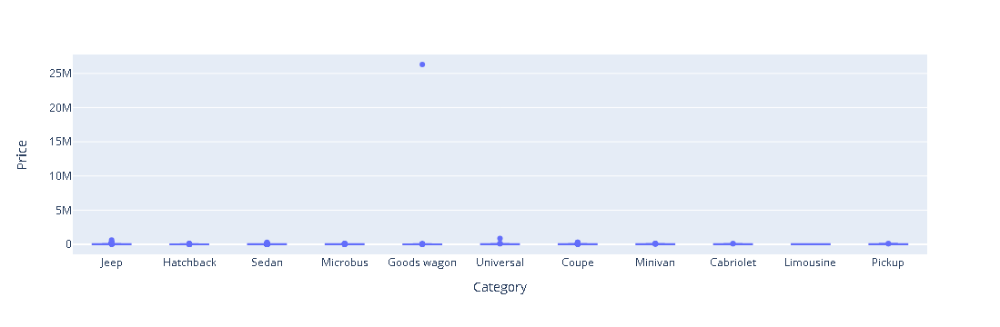

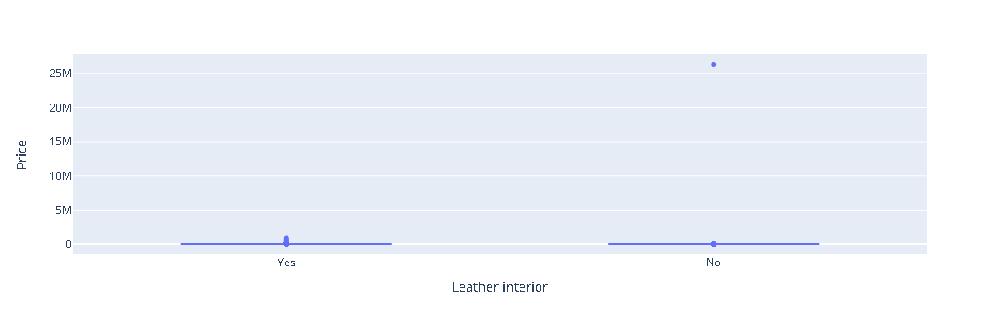

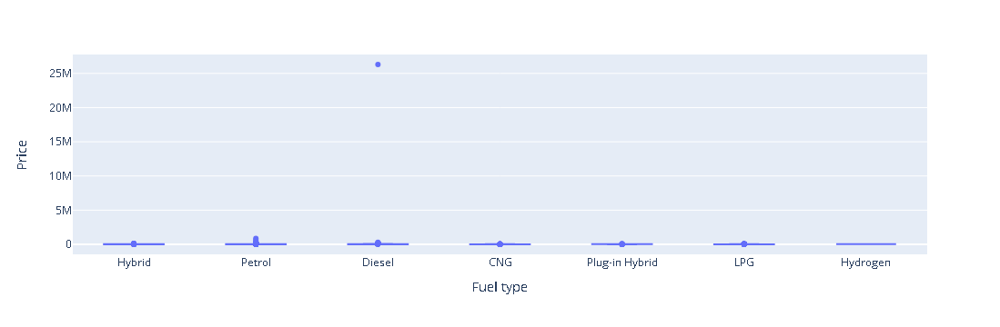

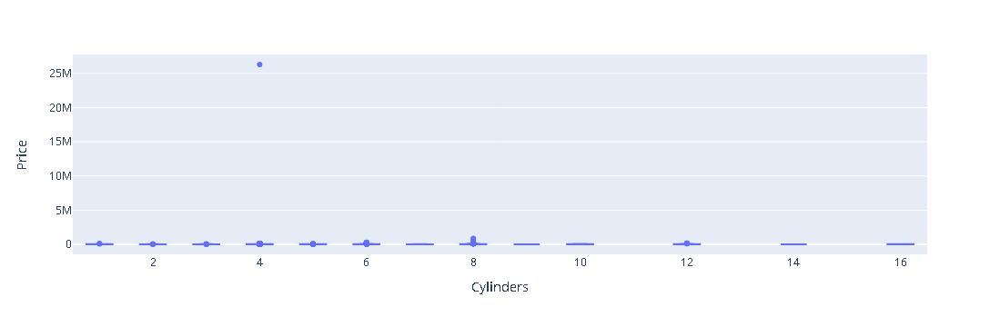

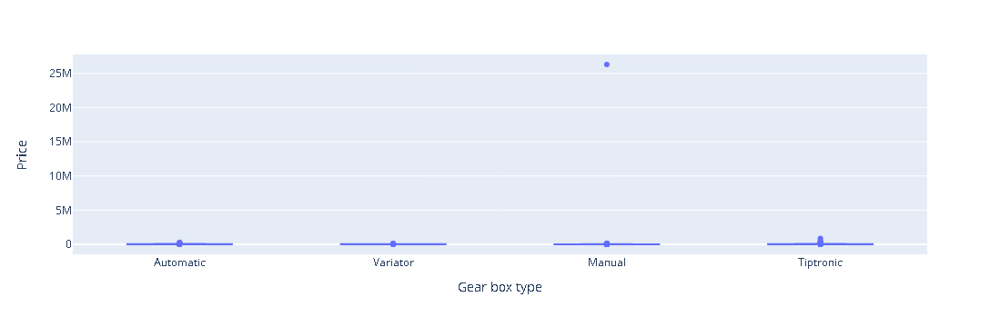

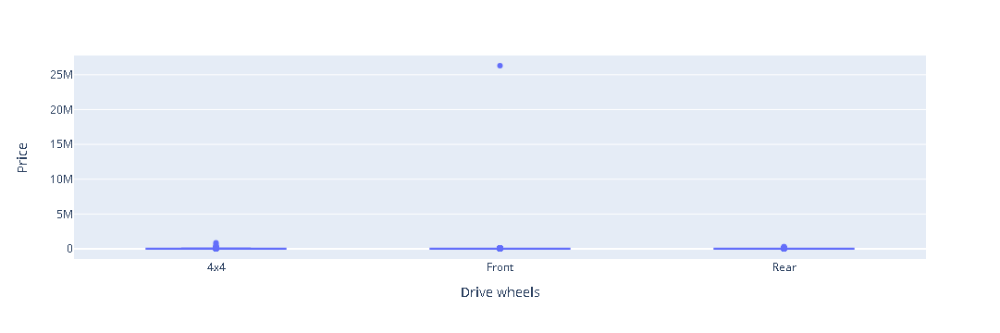

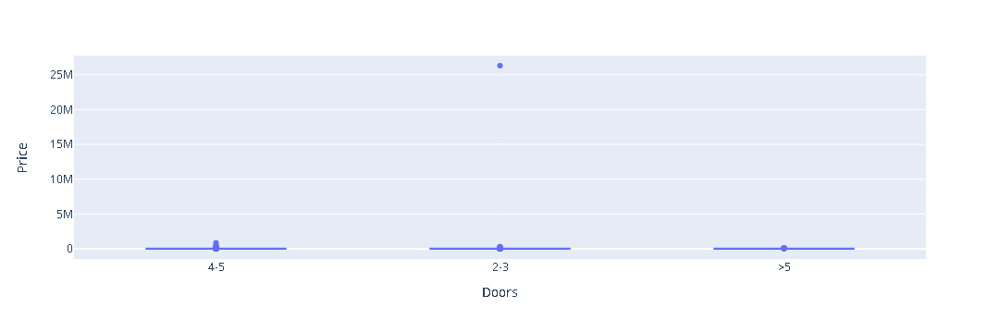

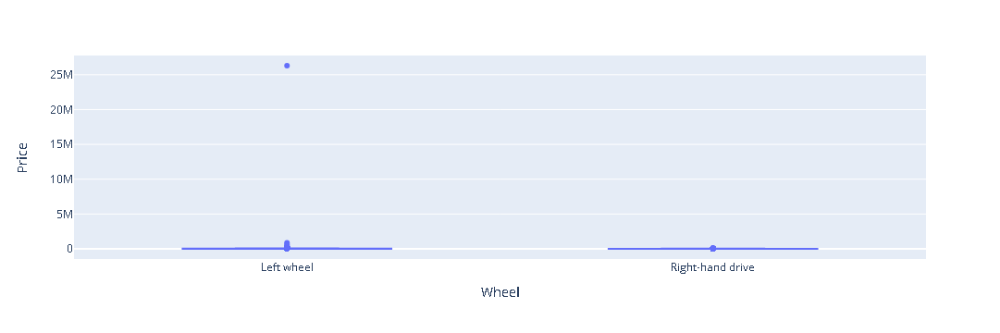

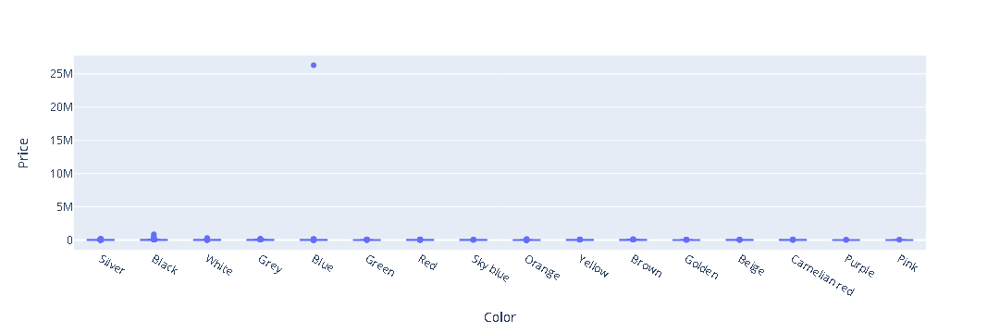

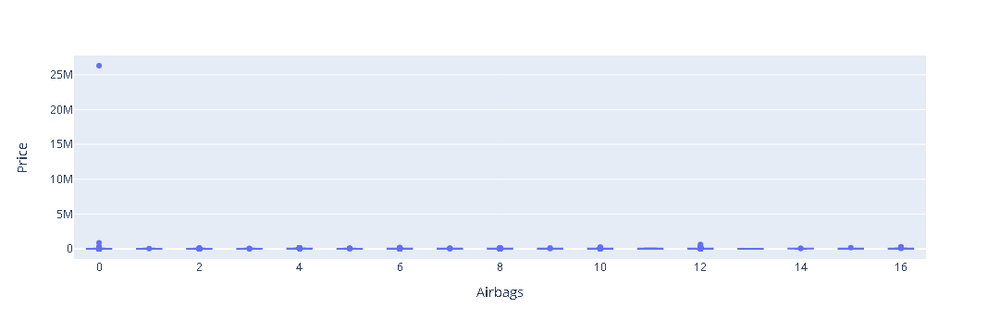

In [338]:
# Kategorik sütunlar için döngü başlatıyoruz
for i in cat_col:
    # Eğer benzersiz değer sayısı 25'ten az ise
    if len(ccars[i].unique()) < 25:
        # Kategorik sütun ile 'Price' (Fiyat) arasında bir kutu grafiği oluşturuyoruz
        boxp = px.box(data_frame=ccars, x=i, y='Price')
        
        # Kutu grafiğini gösteriyoruz
        boxp.show()

In [339]:
len(cars.Model.unique())

1590

In [340]:
# Veri setinin eğitim ve test setlerine ayrılması için hazırlık
X = ccars.copy()  # 'ccars' veri çerçevesinin bir kopyasını oluşturuyoruz
X.drop(columns='Price', inplace=True)  # 'Price' (Fiyat) sütununu özellikler (X) arasından çıkarıyoruz
y = ccars['Price']  # 'Price' (Fiyat) sütununu hedef değişken (y) olarak atıyoruz

In [341]:
X_train , X_test , y_train , y_test = train_test_split(X,y,random_state=1,test_size=0.3)


In [342]:
# Üretim yılı sütunundaki benzersiz değerleri sıralama ve liste oluşturma
yrs = list(X['Prod. year'].sort_values().unique())  
# 'Prod. year' sütunundaki benzersiz değerleri sıralar ve bir listeye atar

# Benzersiz değerleri sayısal bir indeksle eşleştiren bir sözlük oluşturma
mapuni = {j: i for i, j in enumerate(yrs)}  
# Benzersiz yılları sıralı bir şekilde 0'dan başlayarak indeksler

In [343]:
# Kategorik verileri ikili (binary) biçimde kodlamak için BinaryEncoder'ı tanımlıyoruz
ec = ce.BinaryEncoder(
    cols=['Manufacturer', 'Model', 'Category', 'Fuel type', 'Gear box type', 'Drive wheels', 'Color'],  # Kodlanacak kategorik sütunlar
    drop_invariant=False,  # Tekil değerleri düşürmemek için ayar
    return_df=True  # Sonuç olarak bir DataFrame döndürmek için ayar
)

# Eğitim verisini kodlama
X_train_ec = ec.fit_transform(X=X_train)  # Eğitim verisini fit ederek dönüştürüyoruz

# Test verisini kodlama
X_test_ec = ec.transform(X=X_test)  # Test verisini kodluyoruz, eğitim verisindeki dönüşümleri kullanarak

In [356]:
def replace_values(df, column, mapping):
    # Belirtilen sütundaki değerleri verilen eşleme (mapping) ile değiştirir
    df[column] = df[column].replace(mapping)  # 'mapping' sözlüğündeki değerlerle değiştirir
    return df  # Güncellenmiş DataFrame'i döndürür

# 'Prod. year' (Üretim yılı) sütunundaki değerleri 'mapuni' sözlüğü ile değiştiriyoruz
X_train_ec = replace_values(X_train_ec, 'Prod. year', mapuni)
X_test_ec = replace_values(X_test_ec, 'Prod. year', mapuni)

# 'Doors' (Kapılar) sütunundaki değerleri sayısal değerlere eşliyoruz
X_train_ec = replace_values(X_train_ec, 'Doors', {'2-3': 0, '4-5': 1, '>5': 2})
X_test_ec = replace_values(X_test_ec, 'Doors', {'2-3': 0, '4-5': 1, '>5': 2})

# 'Leather interior' (Deri iç mekan) sütunundaki değerleri sayısal değerlere dönüştürüyoruz
X_train_ec = replace_values(X_train_ec, 'Leather interior', {'Yes': 1, 'No': 0})
X_test_ec = replace_values(X_test_ec, 'Leather interior', {'Yes': 1, 'No': 0})

# 'Wheel' (Direksiyon) sütunundaki değerleri sayısal değerlere dönüştürüyoruz
X_train_ec = replace_values(X_train_ec, 'Wheel', {'Left wheel': 1, 'Right-hand drive': 0})
X_test_ec = replace_values(X_test_ec, 'Wheel', {'Left wheel': 1, 'Right-hand drive': 0})


In [357]:
def fillna_and_convert(df, column):
    # Boş (NaN) değerleri 0 ile doldurur ve veriyi önce float, ardından int tipine dönüştürür
    df[column] = df[column].fillna(0).astype(float).astype(int)  
    return df  # Güncellenmiş DataFrame'i döndürür

# X_train_ec veri setindeki 'Cylinders' ve 'Airbags' sütunlarını işleme
X_train_ec = fillna_and_convert(X_train_ec, 'Cylinders')  # 'Cylinders' sütununda eksik değerleri doldurup tip dönüşümü yapar
X_train_ec = fillna_and_convert(X_train_ec, 'Airbags')    # 'Airbags' sütununda eksik değerleri doldurup tip dönüşümü yapar

# X_test_ec veri setindeki 'Cylinders' ve 'Airbags' sütunlarını işleme
X_test_ec = fillna_and_convert(X_test_ec, 'Cylinders')  # 'Cylinders' sütununda eksik değerleri doldurup tip dönüşümü yapar
X_test_ec = fillna_and_convert(X_test_ec, 'Airbags')    # 'Airbags' sütununda eksik değerleri doldurup tip dönüşümü yapar

In [346]:
# XGBoost regresyon modeli oluşturuluyor
# 'n_estimators' parametresi ile 100 adet karar ağacı oluşturulacak
# 'booster' parametresi, ağaç tabanlı model kullanılacağını ('gbtree') belirtir
# 'random_state', modelin yeniden çalıştırıldığında aynı sonuçları vermesi için bir rastgelelik durumu belirler
baseXGB = xg.XGBRegressor(n_estimators=100, booster='gbtree', random_state=10)

In [347]:
baseXGB.fit(X_train_ec,y_train)


XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=10, ...)

In [348]:
# Eğitim veri seti için XGBoost modeli kullanılarak tahminler yapılıyor
y_train_pre_baseXGB = baseXGB.predict(X_train_ec)

# Test veri seti için XGBoost modeli kullanılarak tahminler yapılıyor
y_test_pre_baseXGB = baseXGB.predict(X_test_ec)

In [349]:
# Eğitim veri seti için R-kare (R^2) skorunu hesaplayıp ekrana yazdırıyoruz
Train_rsq_baseXGB = r2_score(y_train, y_train_pre_baseXGB)
print("Train R-square associated with Base XG Boost Regression is: ", Train_rsq_baseXGB, '\n')

# Test veri seti için R-kare (R^2) skorunu hesaplayıp ekrana yazdırıyoruz
Test_rsq_baseXGB = r2_score(y_test, y_test_pre_baseXGB)
print("Test R-square associated with Base XG Boost Regression is: ", Test_rsq_baseXGB, '\n')

# Test veri seti için Kök Ortalama Kare Hatasını (Root Mean Squared Error - RMSE) hesaplayıp yazdırıyoruz
print("Test RMS_error: ", np.sqrt(mean_squared_error(y_test, y_test_pre_baseXGB)), '\n')

# Test veri seti için Ortalama Mutlak Hata (Mean Absolute Error - MAE) hesaplayıp yazdırıyoruz
print("Test Mean absolute error: ", mean_absolute_error(y_test, y_test_pre_baseXGB), '\n')

# Test veri seti için Ortalama Mutlak Yüzde Hatasını (Mean Absolute Percentage Error - MAPE) hesaplayıp yazdırıyoruz
print("Test Mean absolute percentage error: ", mean_absolute_percentage_error(y_test, y_test_pre_baseXGB), '\n')


Train R-square associated with Base XG Boost Regression is :  0.9994474314073383 

Test R-square associated with Base XG Boost Regression is :  -723.9413610210129 

Test RMS_error: 490763.7613657355 

Test Mean absolute error:  14557.907712014336 

Test Mean absolute percentage error:  26.6387848894395 



In [350]:
# 15 katlı çapraz doğrulama ile R-kare (R^2) skorunu hesaplıyoruz
cv_score_baseXGB = cross_val_score(baseXGB, X_test_ec, y_test, cv=15, scoring='r2')

# Her katmanın skorunu ekrana yazdırıyoruz
print('Test Scores:', cv_score_baseXGB)

# Skorların ortalamasını ve standart sapmasını hesaplayıp yazdırıyoruz
print('Score Mean:', cv_score_baseXGB.mean()*100, 'Score Standard Deviation:', cv_score_baseXGB.std()*100)

Test Scores: [0.63588233 0.71824542 0.64602489 0.66951919 0.71156054 0.54043028
 0.68457302 0.71909837 0.73219737 0.70201253 0.60320272 0.67458122
 0.69288251 0.6585236  0.667918  ]
Score Mean 67.04434661593339 Score Standard Deviation 4.846866266056846
